<center><h1>19AIE312-Deep Learning for Signal and Image Processing </h1></center>
<center><h2>SINGLE IMAGE DEHAZING using CycleGAN</h2></center>

## TEAM 3
Adhithan P             - CB.EN.U4AIE19003 </br>

Anuvarshini S P        - CB.EN.U4AIE19011 </BR>

Kabilan N              - CB.EN.U4AIE19033 </BR>

Sivamaran M A C        - CB.EN.U4AIE19061


In [9]:
from os import listdir
from numpy import asarray
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from numpy import savez_compressed
 

In [3]:
# load all images in a directory into memory
def load_images(path, size=(256,256)):
    data_list = list()
    # enumerate filenames in directory, assume all are images
    for filename in listdir(path):
        # load and resize the image
        pixels = load_img(path + filename, target_size=size)
        # convert to numpy array
        pixels = img_to_array(pixels)
        # store
        data_list.append(pixels)
    return asarray(data_list)

# dataset path
path1 = '../input/hazing-dehazing/Haze/'
# load dataset haze
dataA = load_images(path1)
print('Loaded Hazed data: ', dataA.shape)
# load dataset dehaze
path2='../input/hazing-dehazing/deHaze/'
dataB = load_images(path2)
#print('Loaded Dehazed data: ', dataB.shape)
# save as compressed numpy array
filename = 'Haze_DeHaze_256.npz'
savez_compressed(filename, dataA, dataB)
#print('Saved dataset: ', filename)

Hazed data: (51, 256, 256, 3)
DeHazed Data: (56, 256, 256, 3)
Saved dataset:  Haze_DeHaze_256.npz


Loaded:  (51, 256, 256, 3) (56, 256, 256, 3)


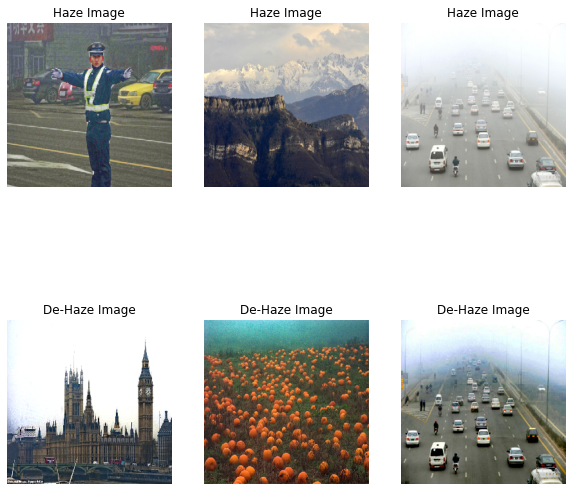

In [11]:
# load and plot the prepared dataset
from numpy import load
import matplotlib.pyplot as plt
# load the dataset
data = load('../input/output-256-haze-dehaze/Haze_DeHaze_256.npz')
dataA, dataB = data['arr_0'], data['arr_1']
print('Loaded: ', dataA.shape, dataB.shape)
# plot source images
n_samples = 3
for i in range(n_samples):
    plt.rcParams["figure.figsize"] = (10,10)
    plt.subplot(2, n_samples, 1 + i)
    plt.axis('off')
    plt.title("Haze Image")
    plt.imshow(dataA[i].astype('uint8'))
    
# plot target image
for i in range(n_samples):
    plt.rcParams["figure.figsize"] = (10,10)
    plt.subplot(2, n_samples, 1 + n_samples + i)
    plt.axis('off')
    plt.title("De-Haze Image")
    plt.imshow(dataB[i].astype('uint8'))
plt.show()

# Reference:
****The CycleGAN model was described by Jun-Yan Zhu, et al. in their 2017 paper titled “Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks.”****

# Discriminator Architecture:
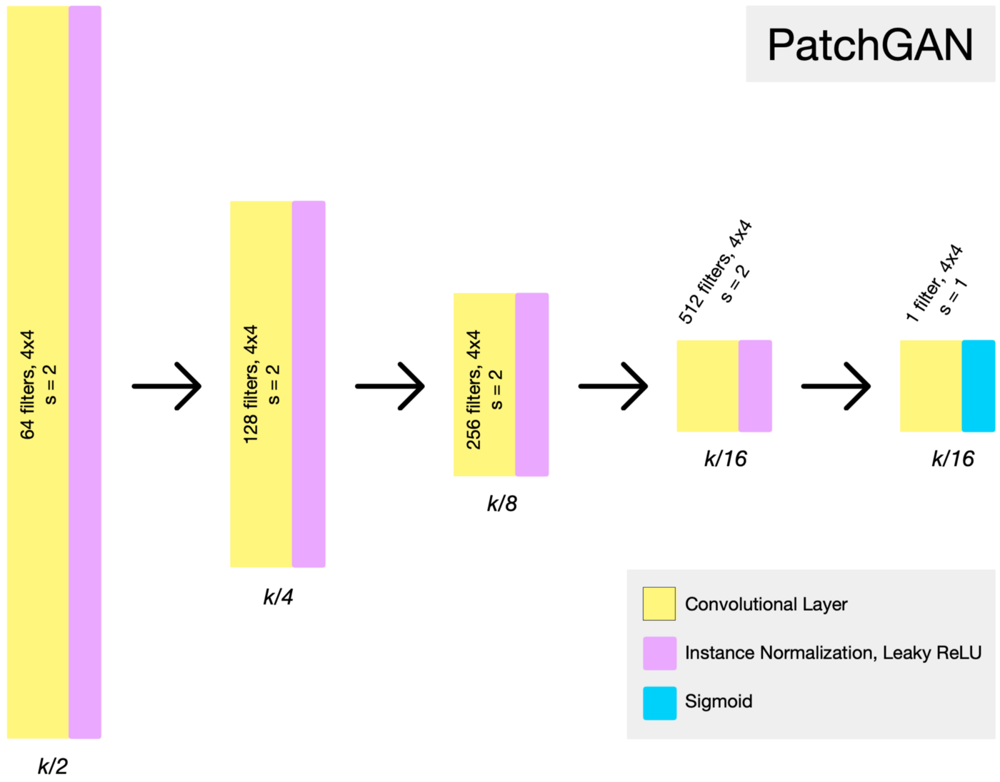

In [12]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-0hze7h54
  Running command git clone --filter=blob:none -q https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-0hze7h54
  Resolved https://www.github.com/keras-team/keras-contrib.git to commit 3fc5ef709e061416f4bc8a92ca3750c824b5d2b0
  Preparing metadata (setup.py) ... done


In [13]:
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# define layer
layer = InstanceNormalization(axis=-1)
#The “axis” argument is set to -1 to ensure that features are normalized per feature map.

The define_discriminator() function below implements the 70x70 PatchGAN discriminator model. The model takes a 256×256 sized image as input and outputs a patch of predictions. The model is optimized using least squares loss (L2) implemented as mean squared error,and a weighting is used so that the model have half (0.5) the usual effect. The authors of CycleGAN paper recommend this weighting of model updates to slow down changes to the discriminator, relative to the generator model during training.

The model does not use batch normalization; instead, instance normalization is used.

    It is a very simple type of normalization and involves standardizing (e.g. scaling to a standard Gaussian) the values on each feature map. 
     
    The key idea is to replace batch normalization layers in the generator architecture with instance normalization layers, and to keep them at test time (as opposed to freeze and simplify them out as done for batch normalization). Intuitively, the normalization process allows to remove instance-specific contrast information from the content image, which simplifies generation. In practice, this results in vastly improved images.

In [14]:
# define the discriminator model
def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # source image input
    in_image = Input(shape=image_shape)
    # C64
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(in_image)
    d = LeakyReLU(alpha=0.2)(d)
    # C128
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C512
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # second last output layer
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # patch output
    patch_out = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    # define model
    model = Model(in_image, patch_out)
    # compile model
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss_weights=[0.5])
    return model

# Generator Architecture:
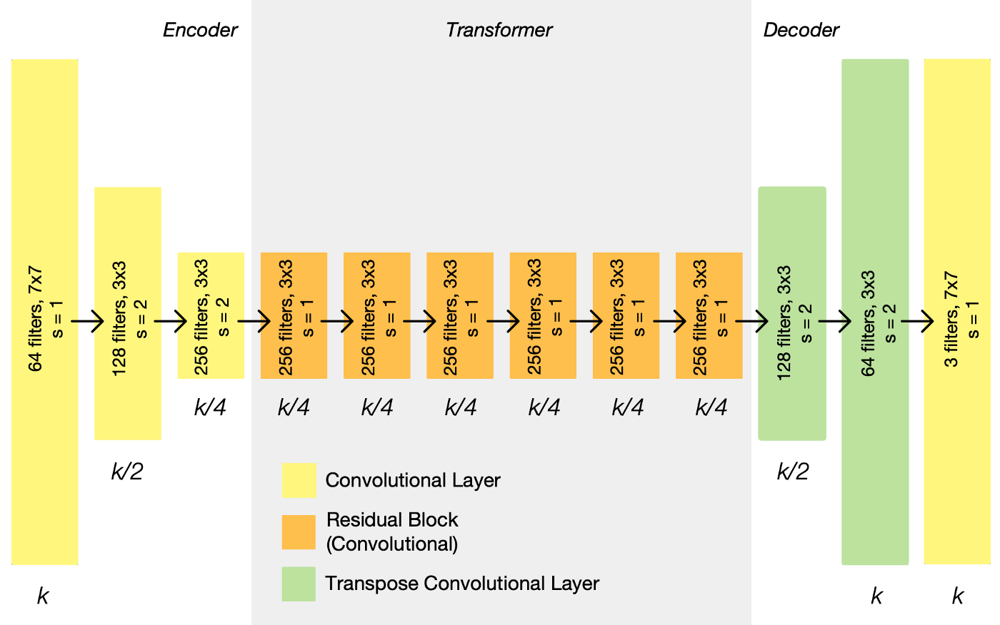

The resnet_block() function that creates two Convolution-InstanceNorm blocks with 3×3 filters and 1×1 stride and without a ReLU activation after the second block.These are blocks comprised of two 3×3 CNN layers where the input to the block is added to the output of the block, channel-wise.

In [15]:
# generator a resnet block
def resnet_block(n_filters, input_layer):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # first layer convolutional layer
    g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(input_layer)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # second convolutional layer
    g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    # concatenate merge channel-wise with input layer
    g = Add()([g, input_layer])
    return g

The generator is an encoder-decoder model architecture. The model takes a source image (e.g. Hazed Image) and generates a target image (e.g. Dehazed Image). First downsampling or encoding the input image down to a bottleneck layer(with reduced dimensionality), then interpreting the encoding with a number of ResNet layers that use skip connections, followed by a series of layers that upsample or decode the representation to the size of the output image.

In [16]:
# define the standalone generator model
def define_generator(image_shape, n_resnet=9):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_image = Input(shape=image_shape)
    #c7s1-k denotes a 7 × 7 Convolution-InstanceNormReLU layer with k filters and stride 1.
    # c7s1-64
    g = Conv2D(64, (7,7), padding='same', kernel_initializer=init)(in_image)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # d128-downsample
    g = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # d256
    g = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # R256-ResNet
    for _ in range(n_resnet):
        g = resnet_block(256, g)
    # u128-upsample
    g = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # u64
    g = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # c7s1-3
    g = Conv2D(3, (7,7), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    out_image = Activation('tanh')(g)
    # define model
    model = Model(in_image, out_image)
    return model

The generator models are not updated directly. Instead, the generator models are updated via composite models. An update to each generator model involves changes to the model weights based on four concerns:

- Adversarial loss (L2 or mean squared error).
- Identity loss (L1 or mean absolute error).
- Forward cycle loss (L1 or mean absolute error).
- Backward cycle loss (L1 or mean absolute error).

The adversarial loss is the standard approach for updating the generator via the discriminator, although in this case, the least squares loss function is used instead of the negative log likelihood (e.g. binary cross-entropy).

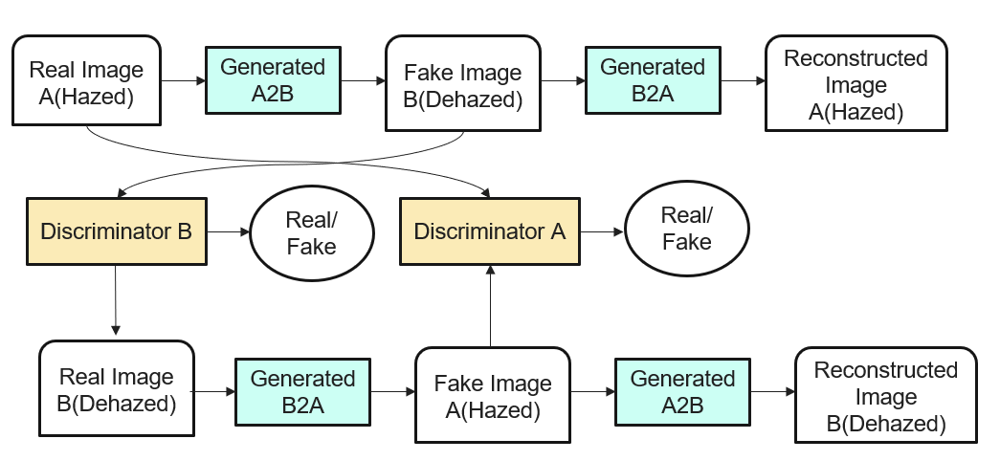
****define_composite_model() updates the generators based on the above losses mentioned****

#### Generator-A Composite Model: Only Generator-A weights are trainable and weights for other models and not trainable.
    
- Adversarial: Domain-B --> Generator-A --> Domain-A --> Discriminator-A --> [real/fake]
- Identity: Domain-A --> Generator-A --> Domain-A
- Forward Cycle: Domain-B--> Generator-A --> Domain-A --> Generator-B --> Domain-B
- Backward Cycle: Domain-A --> Generator-B --> Domain-B --> Generator-A --> Domain-A

#### Generator-B Composite Model: Only Generator-B weights are trainable and weights for other models are not trainable.

- Adversarial: Domain-A --> Generator-B --> Domain-B --> Discriminator-B --> [real/fake]
- Identity: Domain-B --> Generator-B --> Domain-B
- Forward Cycle: Domain-A --> Generator-B--> Domain-B --> Generator-A --> Domain-A
- Backward Cycle: Domain-B --> Generator-A --> Domain-A --> Generator-B --> Domain-B

In [17]:
def define_composite_model(g_model_1, d_model, g_model_2, image_shape):
    # ensure the model we're updating is trainable
    g_model_1.trainable = True
    # mark discriminator as not trainable
    d_model.trainable = False
    # mark other generator model as not trainable
    g_model_2.trainable = False
    # discriminator element
    #Input() is used to instantiate a Keras tensor.A Keras tensor is a symbolic tensor-like object, 
    #which we augment with certain attributes
    
    #adversarial element
    input_gen = Input(shape=image_shape) #->input 1
    gen1_out = g_model_1(input_gen) #input 1 -> g_model_1 -> gen1_out
    output_d = d_model(gen1_out) #input 1 -> g_model_1 -> gen1_out -> d_model -> [Real,Fake], here we compute L2 distance between the gen1_out and the target values of 1.0 for real and 0.0 for fake.
    
    # identity element
    input_id = Input(shape=image_shape) #->input 2
    output_id = g_model_1(input_id) #input 2 -> g_model_1 -> output_id
    
    # forward cycle
    output_f = g_model_2(gen1_out) #input 1 -> g_model_1 -> gen1_out -> g_model_2 -> output_f, here we compare the mae of input 1 and output_f
    
    # backward cycle
    gen2_out = g_model_2(input_id) # input 2 -> g_model_2 -> gen2_out
    output_b = g_model_1(gen2_out) # input 2 -> g_model_2 -> gen2_out -> g_model_1 -> output_b, here we compare the mae of input 2 and output_b
    
    # define model graph
    model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])
    
    # define optimization algorithm configuration
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    
    #The generator is updated as a weighted average of the four loss values.
    #The adversarial loss is weighted normally, whereas the forward and backward cycle loss 
    #is weighted using a parameter called lambda and is set to 10, e.g. 10 times more important than adversarial loss.
    #The identity loss is also weighted as a fraction of the lambda parameter and is set to 0.5×10 or 5 
    #in the official Torch implementation.
    model.compile(loss=['mse', 'mae', 'mae', 'mae'], loss_weights=[1, 5, 10, 10], optimizer=opt)
    return model

In [18]:
# load and prepare training images

#Importantly, the generator model outputs pixel values with the shape as the input and pixel values 
#are in the range [-1, 1], typical for GAN generator models.
def load_real_samples(filename):
    # load the dataset
    data = load(filename)
    # unpack arrays
    X1, X2 = data['arr_0'], data['arr_1']
    # scale from [0,255] to [-1,1]
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]

In [19]:
# select a batch of random samples, returns images and targets(1)
def generate_real_samples(dataset, n_samples, patch_shape):
    # choose random instances
    ix = randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    X = dataset[ix]
    # generate 'real' class labels (1)
    #the shape of the PatchGAN output is also provided, which in the case of 256×256 images will be 16, or a 16x16x1 activation map
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return X, y

In [20]:
#The generate_fake_samples() function below generates the sample 
#given a generator model and the sample of real images from the source domain.
# generate a batch of images, returns images and targets(0)
def generate_fake_samples(g_model, dataset, patch_shape):
    # generate fake instance
    X = g_model.predict(dataset)
    # create 'fake' class labels (0)
    #the shape of the PatchGAN output is also provided, which in the case of 256×256 images will be 16, or a 16x16x1 activation map
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

In [21]:
# save the generator models to file
def save_models(step, g_model_AtoB, g_model_BtoA):
    # save the first generator model
    filename1 = 'g_model_AtoB_%06d.h5' % (step+1)
    g_model_AtoB.save(filename1)
    # save the second generator model
    filename2 = 'g_model_BtoA_%06d.h5' % (step+1)
    g_model_BtoA.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))

To reduce model oscillation, we follow Shrivastava et al.’s strategy and update the discriminators using a history of generated images rather than the ones produced by the latest generators. We keep an image buffer that stores the 50 previously created images.


In [22]:
# update image pool for fake images
def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            # stock the pool
            pool.append(image)
            selected.append(image)
        elif random() < 0.5: #if fake images and exceeds max_size
            # use image, but don't add it to the pool
            selected.append(image)
        else:
            # replace an existing image and use replaced image
            ix = randint(0, len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return asarray(selected)

We can then update our image pool with generated fake images, the results of which can be used to train the discriminator models.

In [23]:
# train cyclegan models
def train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, dataset):
    # define properties of the training run
    n_epochs, n_batch = 40, 1 
    
    # determine the output square shape of the discriminator
    n_patch = d_model_A.output_shape[1]
    # unpack dataset
    trainA, trainB = dataset #Hazed and Dehazed
    
    # prepare image pool for fakes
    poolA, poolB = list(), list()
    
    # calculate the number of batches per training epoch
    bat_per_epo = int(len(trainA) / n_batch)
    # batch per epoch is 51 each of size 1.
    
    # calculate the number of training iterations
    n_steps = bat_per_epo * n_epochs
    
    # manually enumerate epochs
    for i in range(n_steps):
        # select a batch of real samples
        X_realA, y_realA = generate_real_samples(trainA, n_batch, n_patch)
        X_realB, y_realB = generate_real_samples(trainB, n_batch, n_patch)
        
        # generate a batch of fake samples
        X_fakeA, y_fakeA = generate_fake_samples(g_model_BtoA, X_realB, n_patch)
        X_fakeB, y_fakeB = generate_fake_samples(g_model_AtoB, X_realA, n_patch)
        
        # update fakes from pool
        X_fakeA = update_image_pool(poolA, X_fakeA)
        X_fakeB = update_image_pool(poolB, X_fakeB)
        
        # update generator B->A via adversarial and cycle loss
        g_loss2, _, _, _, _  = c_model_BtoA.train_on_batch([X_realB, X_realA], [y_realA, X_realA, X_realB, X_realA])
        #model.train_on_batch, as the name implies, trains only one batch.
        
        # update discriminator for A -> [real/fake]
        dA_loss1 = d_model_A.train_on_batch(X_realA, y_realA) #D(x)
        dA_loss2 = d_model_A.train_on_batch(X_fakeA, y_fakeA) #D(G(z))
        
        # update generator A->B via adversarial and cycle loss
        g_loss1, _, _, _, _ = c_model_AtoB.train_on_batch([X_realA, X_realB], [y_realB, X_realB, X_realA, X_realB])
        
        # update discriminator for B -> [real/fake]
        dB_loss1 = d_model_B.train_on_batch(X_realB, y_realB) 
        dB_loss2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)
        
        # summarize performance
        print('>%d, dA[%.3f,%.3f] dB[%.3f,%.3f] g[%.3f,%.3f]' % (i+1, dA_loss1,dA_loss2, dB_loss1,dB_loss2, g_loss1,g_loss2))
        if (i+1) % (bat_per_epo * 1) == 0:
            # save the models
            save_models(i, g_model_AtoB, g_model_BtoA)

In [24]:
from random import random
from numpy import load
from numpy import zeros
from numpy import ones
from numpy import asarray
from numpy.random import randint
from tensorflow.keras.optimizers import Adam 
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate,Add

In [25]:
# load image data
dataset = load_real_samples('../input/output-256-haze-dehaze/Haze_DeHaze_256.npz')
print('Loaded', dataset[0].shape, dataset[1].shape)
# define input shape based on the loaded dataset
image_shape = dataset[0].shape[1:]
# generator: A -> B
g_model_AtoB = define_generator(image_shape)
# generator: B -> A
g_model_BtoA = define_generator(image_shape)
# discriminator: A -> [real/fake]
d_model_A = define_discriminator(image_shape)
# discriminator: B -> [real/fake]
d_model_B = define_discriminator(image_shape)
# composite: A -> B -> [real/fake, A]
c_model_AtoB = define_composite_model(g_model_AtoB, d_model_B, g_model_BtoA, image_shape)
# composite: B -> A -> [real/fake, B]
c_model_BtoA = define_composite_model(g_model_BtoA, d_model_A, g_model_AtoB, image_shape)
# train models
train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, dataset)

Loaded (51, 256, 256, 3) (56, 256, 256, 3)


2022-05-04 12:07:17.062733: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-04 12:07:17.178829: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-04 12:07:17.179606: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-04 12:07:17.181089: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

>1, dA[1.001,0.942] dB[1.192,0.805] g[18.912,18.276]
>2, dA[2.596,1.065] dB[1.234,1.822] g[18.239,16.538]
>3, dA[2.426,1.395] dB[1.410,2.584] g[19.574,20.222]
>4, dA[5.069,2.790] dB[0.996,2.944] g[20.820,18.460]
>5, dA[6.292,2.086] dB[5.472,2.022] g[21.275,19.395]
>6, dA[14.270,2.049] dB[6.162,3.070] g[19.949,20.306]
>7, dA[2.274,2.895] dB[2.721,2.274] g[14.684,15.049]
>8, dA[5.105,1.228] dB[1.155,0.993] g[18.332,19.963]
>9, dA[5.734,1.397] dB[1.482,1.868] g[16.302,15.686]
>10, dA[0.984,1.770] dB[1.462,2.777] g[15.642,16.380]
>11, dA[1.724,2.393] dB[2.917,1.365] g[12.267,13.063]
>12, dA[1.246,0.728] dB[1.547,1.638] g[14.848,14.868]
>13, dA[0.841,0.713] dB[0.597,1.138] g[10.233,10.466]
>14, dA[0.654,0.948] dB[0.405,0.917] g[10.324,11.333]
>15, dA[0.399,1.844] dB[0.705,1.335] g[15.076,16.251]
>16, dA[0.443,0.770] dB[1.397,0.646] g[12.028,11.054]
>17, dA[0.190,0.786] dB[1.039,1.278] g[19.127,17.196]
>18, dA[0.853,2.325] dB[0.646,1.275] g[12.287,16.471]
>19, dA[0.467,1.224] dB[0.603,0.767]

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


>Saved: g_model_AtoB_000051.h5 and g_model_BtoA_000051.h5
>52, dA[0.114,0.213] dB[0.269,0.197] g[10.415,12.860]
>53, dA[0.139,0.159] dB[0.155,0.158] g[9.327,9.542]
>54, dA[0.134,0.206] dB[0.213,0.231] g[10.783,10.260]
>55, dA[0.252,0.179] dB[0.100,0.156] g[7.272,8.236]
>56, dA[0.286,0.694] dB[0.172,0.150] g[9.269,10.930]
>57, dA[0.323,0.132] dB[0.124,0.242] g[9.887,11.286]
>58, dA[0.119,0.094] dB[0.224,0.098] g[7.170,8.314]
>59, dA[0.085,0.167] dB[0.162,0.047] g[7.467,6.891]
>60, dA[0.157,0.217] dB[0.168,0.177] g[7.149,6.598]
>61, dA[0.356,0.216] dB[0.079,0.066] g[6.560,7.888]
>62, dA[0.111,0.150] dB[0.179,0.272] g[7.577,8.950]
>63, dA[0.268,0.315] dB[0.117,0.107] g[7.444,8.202]
>64, dA[0.242,0.243] dB[0.275,0.228] g[7.967,8.157]
>65, dA[0.107,0.193] dB[0.194,0.236] g[7.753,7.511]
>66, dA[0.322,0.170] dB[0.089,0.243] g[7.733,8.022]
>67, dA[0.131,0.128] dB[0.138,0.063] g[10.803,11.188]
>68, dA[0.221,0.378] dB[0.252,0.279] g[10.263,8.957]
>69, dA[0.128,0.242] dB[0.201,0.213] g[11.667,9.9

2022-05-04 12:13:20.981971: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>397, dA[0.387,0.162] dB[0.064,0.154] g[6.729,7.155]
>398, dA[0.180,0.190] dB[0.118,0.056] g[9.585,8.761]
>399, dA[0.136,0.095] dB[0.415,0.216] g[11.162,11.058]
>400, dA[0.047,0.225] dB[0.018,0.072] g[11.531,10.741]
>401, dA[0.202,0.125] dB[0.036,0.025] g[9.956,8.330]
>402, dA[0.156,0.302] dB[0.218,0.185] g[10.805,10.364]
>403, dA[0.158,0.120] dB[0.019,0.072] g[8.326,8.001]
>404, dA[0.042,0.187] dB[0.054,0.018] g[7.175,7.686]
>405, dA[0.042,0.081] dB[0.101,0.050] g[7.714,8.426]
>406, dA[0.268,0.268] dB[0.293,0.160] g[6.515,7.355]
>407, dA[0.154,0.110] dB[0.061,0.142] g[6.782,7.929]
>408, dA[0.186,0.228] dB[0.029,0.073] g[6.227,5.923]
>Saved: g_model_AtoB_000408.h5 and g_model_BtoA_000408.h5
>409, dA[0.116,0.227] dB[0.501,0.212] g[5.418,4.937]
>410, dA[0.139,0.160] dB[0.102,0.234] g[5.244,5.521]
>411, dA[0.144,0.062] dB[0.137,0.071] g[7.139,8.425]
>412, dA[0.200,0.303] dB[0.072,0.062] g[5.700,5.653]
>413, dA[0.051,0.045] dB[0.056,0.029] g[7.791,7.242]
>414, dA[0.066,0.066] dB[0.216,0.08

2022-05-04 12:15:57.070612: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>600, dA[0.053,0.123] dB[0.129,0.037] g[10.070,10.851]
>601, dA[0.141,0.051] dB[0.047,0.084] g[12.789,12.837]
>602, dA[0.034,0.089] dB[0.029,0.014] g[10.388,11.564]
>603, dA[0.183,0.063] dB[0.183,0.106] g[5.644,6.133]
>604, dA[0.134,0.288] dB[0.037,0.066] g[6.453,7.059]
>605, dA[0.051,0.112] dB[0.029,0.018] g[7.329,6.427]
>606, dA[0.055,0.059] dB[0.378,0.166] g[6.000,6.910]
>607, dA[0.188,0.040] dB[0.044,0.026] g[6.717,8.125]
>608, dA[0.139,0.159] dB[0.083,0.034] g[5.023,4.887]
>609, dA[0.069,0.157] dB[0.484,0.142] g[7.981,8.338]
>610, dA[0.057,0.048] dB[0.096,0.046] g[10.287,12.131]
>611, dA[0.354,0.091] dB[0.077,0.047] g[9.976,9.005]
>612, dA[0.072,0.059] dB[0.241,0.157] g[7.575,7.168]
>Saved: g_model_AtoB_000612.h5 and g_model_BtoA_000612.h5
>613, dA[0.052,0.042] dB[0.013,0.067] g[9.093,9.960]
>614, dA[0.157,0.347] dB[0.017,0.035] g[6.912,6.058]
>615, dA[0.151,0.107] dB[0.048,0.015] g[5.544,5.653]
>616, dA[0.238,0.144] dB[0.089,0.132] g[5.289,6.092]
>617, dA[0.053,0.103] dB[0.028,0.

2022-05-04 12:20:33.621481: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled
2022-05-04 12:20:33.644777: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>958, dA[0.046,0.032] dB[0.324,0.241] g[9.443,10.215]
>959, dA[0.316,0.110] dB[0.057,0.034] g[5.045,5.883]
>960, dA[0.091,0.136] dB[0.335,0.056] g[5.021,4.192]
>961, dA[0.052,0.035] dB[0.035,0.040] g[8.155,8.951]
>962, dA[0.340,0.347] dB[0.186,0.071] g[8.104,6.953]
>963, dA[0.064,0.045] dB[0.045,0.059] g[6.252,6.778]
>964, dA[0.177,0.083] dB[0.084,0.063] g[5.277,5.573]
>965, dA[0.028,0.021] dB[0.038,0.017] g[4.391,4.895]
>966, dA[0.076,0.116] dB[0.089,0.087] g[4.789,4.981]
>967, dA[0.098,0.065] dB[0.012,0.052] g[5.116,4.195]
>968, dA[0.073,0.199] dB[0.365,0.486] g[4.204,3.642]
>969, dA[0.029,0.046] dB[0.026,0.071] g[7.944,6.787]
>Saved: g_model_AtoB_000969.h5 and g_model_BtoA_000969.h5
>970, dA[0.051,0.057] dB[0.123,0.066] g[13.721,13.073]
>971, dA[0.048,0.136] dB[0.294,0.209] g[6.613,7.228]
>972, dA[0.049,0.336] dB[0.139,0.118] g[4.325,4.104]
>973, dA[0.261,0.032] dB[0.025,0.090] g[5.421,6.426]
>974, dA[0.197,0.050] dB[0.064,0.058] g[5.788,6.698]
>975, dA[0.085,0.147] dB[0.199,0.125] 

2022-05-04 12:21:15.710965: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1013, dA[0.025,0.100] dB[0.082,0.018] g[5.277,5.108]
>1014, dA[0.069,0.015] dB[0.468,0.069] g[10.844,11.425]
>1015, dA[0.052,0.061] dB[0.060,0.078] g[4.839,5.509]
>1016, dA[0.149,0.111] dB[0.028,0.106] g[5.617,6.081]
>1017, dA[0.071,0.055] dB[0.141,0.013] g[6.284,5.983]
>1018, dA[0.093,0.275] dB[0.076,0.090] g[4.328,4.541]
>1019, dA[0.292,0.056] dB[0.010,0.036] g[5.668,5.684]
>1020, dA[0.027,0.065] dB[0.269,0.278] g[8.069,8.624]
>Saved: g_model_AtoB_001020.h5 and g_model_BtoA_001020.h5
>1021, dA[0.012,0.061] dB[0.059,0.020] g[6.331,6.586]
>1022, dA[0.076,0.041] dB[0.302,0.096] g[5.601,5.249]
>1023, dA[0.365,0.065] dB[0.011,0.248] g[8.779,7.994]
>1024, dA[0.041,0.201] dB[0.148,0.138] g[4.217,4.695]
>1025, dA[0.020,0.037] dB[0.177,0.036] g[5.481,5.396]
>1026, dA[0.074,0.038] dB[0.109,0.174] g[6.151,7.528]
>1027, dA[0.123,0.345] dB[0.045,0.036] g[4.161,4.274]
>1028, dA[0.094,0.053] dB[0.015,0.027] g[4.439,4.516]
>1029, dA[0.022,0.223] dB[0.100,0.048] g[5.145,4.749]
>1030, dA[0.053,0.012]

2022-05-04 12:21:38.094966: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1041, dA[0.021,0.044] dB[0.058,0.181] g[7.702,9.822]
>1042, dA[0.057,0.021] dB[0.031,0.074] g[7.140,6.224]
>1043, dA[0.145,0.164] dB[0.091,0.139] g[5.100,4.586]
>1044, dA[0.033,0.031] dB[0.098,0.049] g[9.195,10.169]
>1045, dA[0.025,0.022] dB[0.038,0.049] g[7.861,7.864]
>1046, dA[0.078,0.030] dB[0.038,0.033] g[7.859,8.123]
>1047, dA[0.244,0.104] dB[0.218,0.049] g[8.880,11.013]
>1048, dA[0.017,0.057] dB[0.023,0.183] g[6.319,8.228]
>1049, dA[0.191,0.064] dB[0.191,0.043] g[5.743,5.909]
>1050, dA[0.014,0.146] dB[0.038,0.075] g[4.306,5.231]
>1051, dA[0.224,0.091] dB[0.047,0.087] g[5.231,5.691]
>1052, dA[0.242,0.299] dB[0.101,0.044] g[5.861,5.597]
>1053, dA[0.067,0.033] dB[0.027,0.033] g[6.621,6.387]
>1054, dA[0.313,0.256] dB[0.074,0.102] g[9.300,7.323]
>1055, dA[0.082,0.089] dB[0.067,0.058] g[4.506,4.467]
>1056, dA[0.055,0.074] dB[0.036,0.064] g[6.841,6.308]
>1057, dA[0.050,0.028] dB[0.191,0.018] g[6.697,5.909]
>1058, dA[0.085,0.183] dB[0.046,0.398] g[3.691,4.305]
>1059, dA[0.061,0.042] dB[

2022-05-04 12:26:12.705215: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1399, dA[0.189,0.379] dB[0.012,0.083] g[5.749,5.275]
>1400, dA[0.113,0.032] dB[0.536,0.128] g[8.981,9.021]
>1401, dA[0.108,0.062] dB[0.026,0.039] g[4.943,6.253]
>1402, dA[0.027,0.115] dB[0.100,0.087] g[6.416,5.895]
>1403, dA[0.207,0.027] dB[0.013,0.070] g[5.707,7.317]
>1404, dA[0.029,0.054] dB[0.101,0.020] g[5.149,5.501]
>1405, dA[0.100,0.114] dB[0.045,0.067] g[7.782,6.197]
>1406, dA[0.015,0.061] dB[0.016,0.024] g[7.288,7.753]
>1407, dA[0.138,0.145] dB[0.087,0.117] g[4.896,4.921]
>1408, dA[0.177,0.032] dB[0.025,0.047] g[7.249,7.090]
>1409, dA[0.020,0.027] dB[0.019,0.023] g[7.297,6.489]
>1410, dA[0.054,0.074] dB[0.011,0.058] g[6.094,5.763]
>1411, dA[0.080,0.052] dB[0.225,0.022] g[4.348,4.301]
>1412, dA[0.381,0.198] dB[0.105,0.094] g[4.748,5.549]
>1413, dA[0.059,0.078] dB[0.427,0.092] g[4.702,4.761]
>1414, dA[0.056,0.118] dB[0.061,0.106] g[9.481,11.257]
>1415, dA[0.046,0.342] dB[0.042,0.035] g[6.005,6.180]
>1416, dA[0.111,0.071] dB[0.021,0.034] g[5.316,6.476]
>1417, dA[0.236,0.155] dB[0

2022-05-04 12:28:20.909452: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1566, dA[0.051,0.040] dB[0.038,0.155] g[7.244,7.521]
>1567, dA[0.142,0.055] dB[0.094,0.025] g[5.013,5.185]
>1568, dA[0.034,0.133] dB[0.263,0.123] g[7.110,7.927]
>1569, dA[0.078,0.060] dB[0.210,0.255] g[8.116,10.303]
>1570, dA[0.031,0.051] dB[0.019,0.137] g[6.960,8.427]
>1571, dA[0.043,0.038] dB[0.057,0.021] g[4.812,5.863]
>1572, dA[0.008,0.084] dB[0.112,0.023] g[4.781,5.082]
>1573, dA[0.070,0.119] dB[0.014,0.081] g[8.193,7.215]
>1574, dA[0.099,0.072] dB[0.017,0.180] g[9.467,9.106]
>1575, dA[0.409,0.051] dB[0.025,0.048] g[6.149,5.636]
>1576, dA[0.033,0.235] dB[0.060,0.075] g[8.240,8.980]
>1577, dA[0.028,0.013] dB[0.228,0.211] g[8.133,9.169]
>1578, dA[0.042,0.021] dB[0.082,0.063] g[6.645,9.126]
>1579, dA[0.012,0.136] dB[0.018,0.031] g[10.224,9.509]
>1580, dA[0.238,0.027] dB[0.042,0.015] g[10.448,10.221]
>1581, dA[0.025,0.034] dB[0.007,0.030] g[7.151,8.090]
>Saved: g_model_AtoB_001581.h5 and g_model_BtoA_001581.h5
>1582, dA[0.034,0.116] dB[0.077,0.048] g[6.120,6.816]
>1583, dA[0.288,0.11

2022-05-04 12:30:03.779185: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1699, dA[0.077,0.061] dB[0.080,0.042] g[7.883,6.494]
>1700, dA[0.017,0.056] dB[0.050,0.015] g[4.776,5.394]
>1701, dA[0.044,0.024] dB[0.050,0.182] g[7.961,8.397]
>1702, dA[0.027,0.019] dB[0.074,0.075] g[6.986,6.810]
>1703, dA[0.052,0.130] dB[0.275,0.273] g[4.667,4.958]
>1704, dA[0.027,0.042] dB[0.070,0.044] g[9.483,12.008]
>1705, dA[0.153,0.031] dB[0.074,0.019] g[8.847,10.426]
>1706, dA[0.058,0.027] dB[0.184,0.058] g[5.090,5.170]
>1707, dA[0.075,0.161] dB[0.028,0.139] g[6.452,5.976]
>1708, dA[0.015,0.059] dB[0.071,0.035] g[7.053,8.472]
>1709, dA[0.025,0.014] dB[0.052,0.020] g[5.982,6.347]
>1710, dA[0.142,0.118] dB[0.218,0.087] g[5.157,5.610]
>1711, dA[0.031,0.140] dB[0.148,0.059] g[5.692,4.907]
>1712, dA[0.045,0.038] dB[0.279,0.052] g[6.209,6.291]
>1713, dA[0.069,0.148] dB[0.027,0.091] g[9.549,8.856]
>1714, dA[0.071,0.034] dB[0.048,0.009] g[8.248,9.008]
>1715, dA[0.098,0.083] dB[0.049,0.018] g[6.531,7.498]
>1716, dA[0.072,0.084] dB[0.059,0.086] g[5.559,5.519]
>1717, dA[0.038,0.021] dB[

**The loss is reported each training iteration, including the Discriminator-A loss on real and fake examples (dA), Discriminator-B loss on real and fake examples (dB), and Generator-AtoB and Generator-BtoA loss, each of which is a weighted average of adversarial, identity, forward, and backward cycle loss (g).**

In [32]:
from keras.models import load_model
from numpy import load
from matplotlib import pyplot
from numpy.random import randint
from numpy import vstack
 
# load and prepare training images
def load_real_samples(filename):
    # load the dataset
    data = load(filename)
    # unpack arrays
    X1, X2 = data['arr_0'], data['arr_1']
    # scale from [0,255] to [-1,1]
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]
 
# select a random sample of images from the dataset
def select_sample(dataset):
    # choose random instances
    ix = randint(0, dataset.shape[0], 1)
    # retrieve selected images
    X = dataset[ix]
    return X
 
# plot the image, the translation, and the reconstruction
def show_plot(imagesX, imagesY1, imagesY2):
    images = vstack((imagesX, imagesY1, imagesY2))
    titles = ['Haze Image', 'Dehazed Image', 'Reconstructed Hazed Image']
    # scale from [-1,1] to [0,1]
    images = (images + 1) / 2.0
    # plot images row by row
    for i in range(len(images)):
        plt.rcParams["figure.figsize"] = (10,10)
        # define subplot
        plt.subplot(1, len(images), 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(images[i])
        # title
        plt.title(titles[i])
    plt.show()
    
# load dataset
A_data, B_data = load_real_samples('../input/output-256-haze-dehaze/Haze_DeHaze_256.npz')
print('Loaded', A_data.shape, B_data.shape)


Loaded (51, 256, 256, 3) (56, 256, 256, 3)


In [33]:
def plt_model(num):
    # load the models
    cust = {'InstanceNormalization': InstanceNormalization}
    model_AtoB = load_model('g_model_AtoB_%06d.h5' % num, cust)
    model_BtoA = load_model('g_model_BtoA_%06d.h5' % num, cust)
    # plot A->B->A
    A_real = select_sample(A_data)
    B_generate  = model_AtoB.predict(A_real)
   # B_generated=cv2.cvtColor(B_generate, cv2.COLOR_BGR2GRAY)
    #B_generated = cv2.equalizeHist(B_generate)
    A_reconstructed = model_BtoA.predict(B_generate)
    show_plot(A_real, B_generate, A_reconstructed)
    # plot B->A->B
#     B_real = select_sample(B_data)
#     A_generated  = model_BtoA.predict(B_real)
#     B_reconstructed = model_AtoB.predict(A_generated)
#     show_plot(B_real, A_generated, B_reconstructed)


1


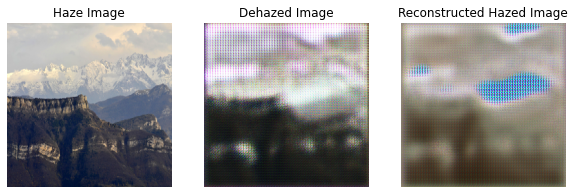

2


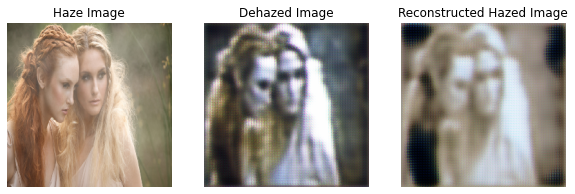

3


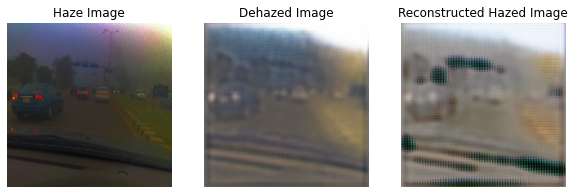

4


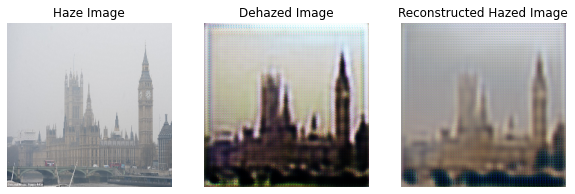

5


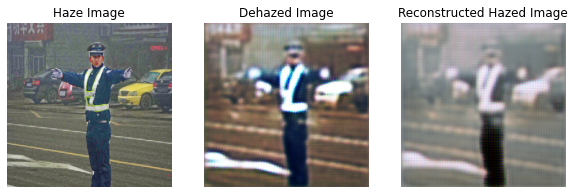

6


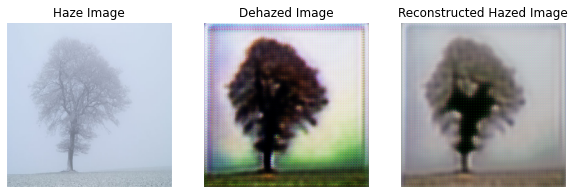

7


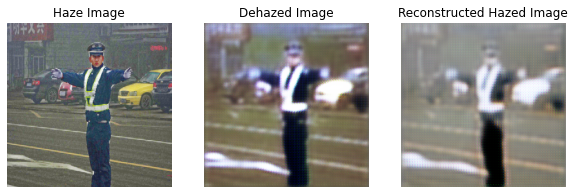

8


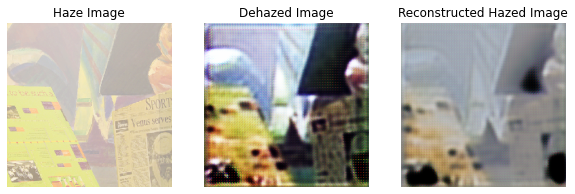

9


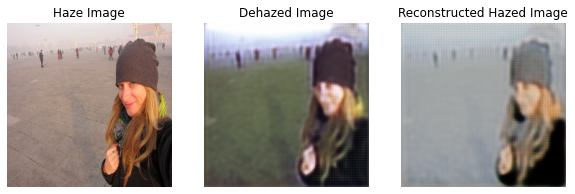

10


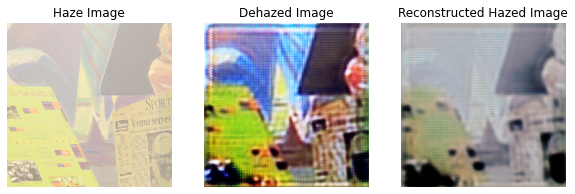

11


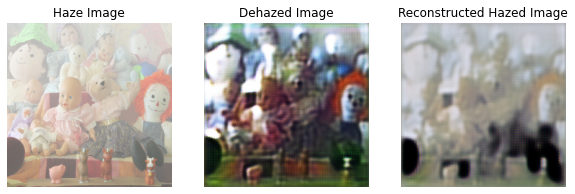

12


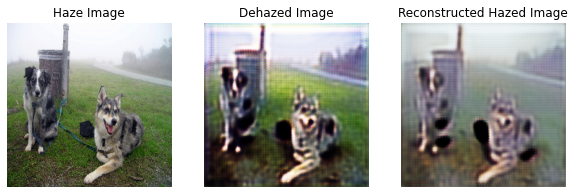

13


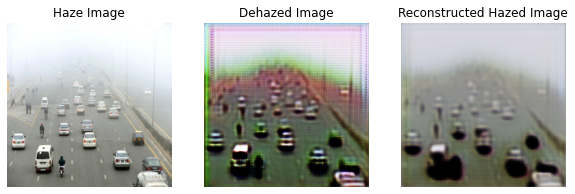

14


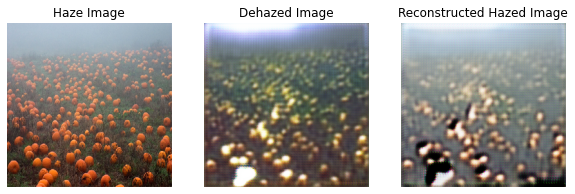

15


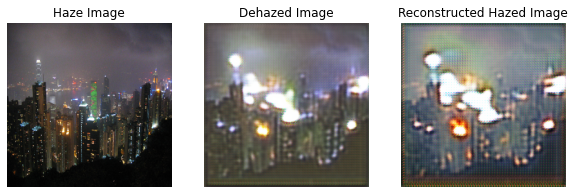

16


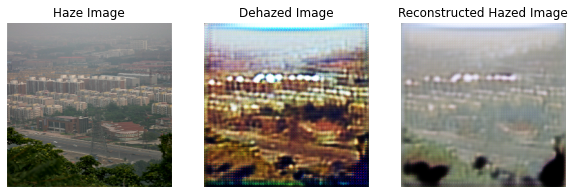

17


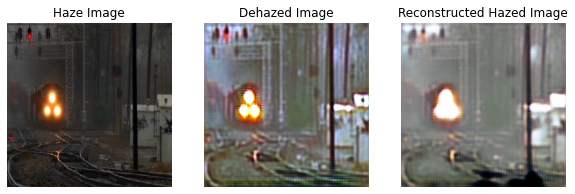

18


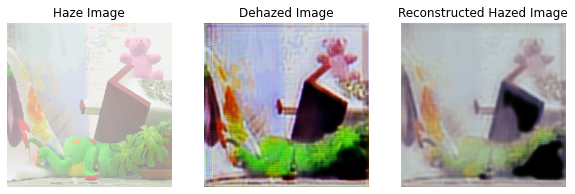

19


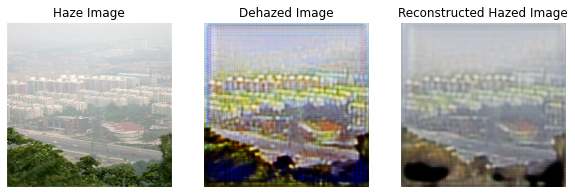

20


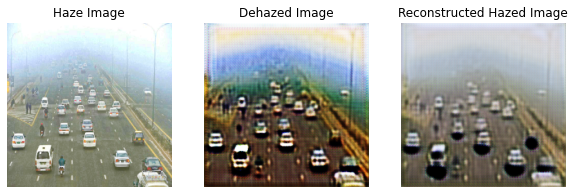

21


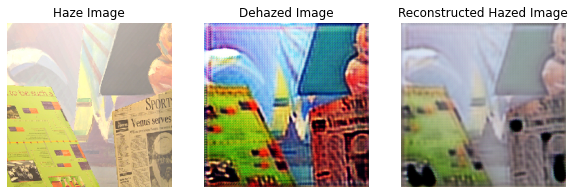

22


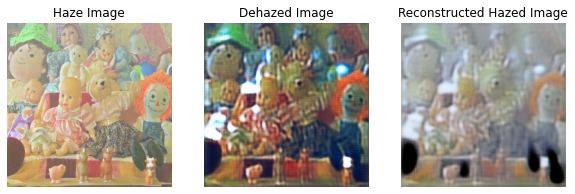

23


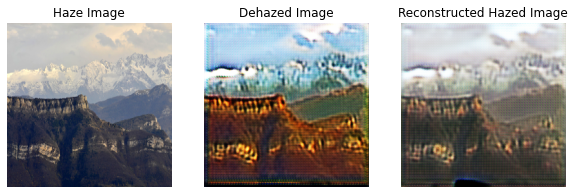

24


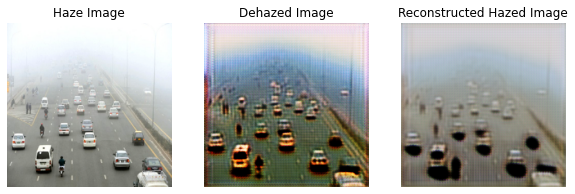

25


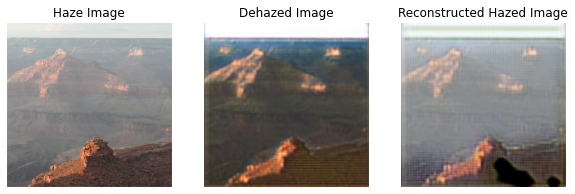

26


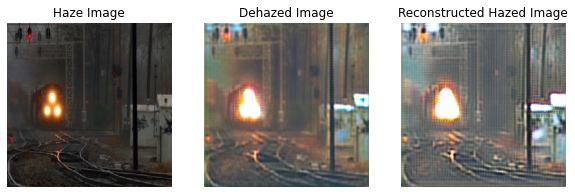

27


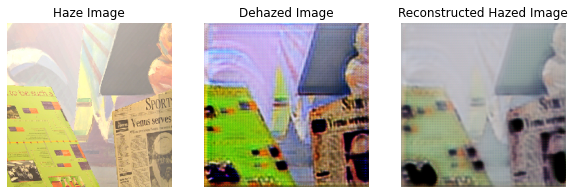

28


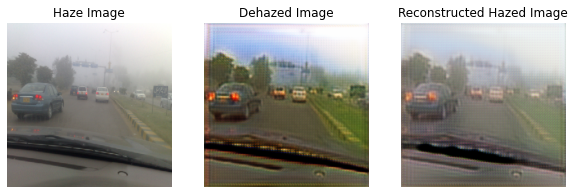

29


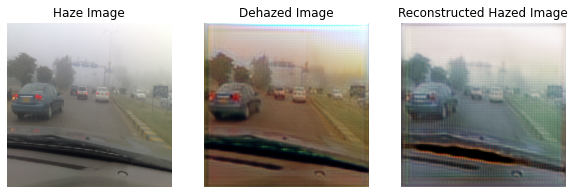

30


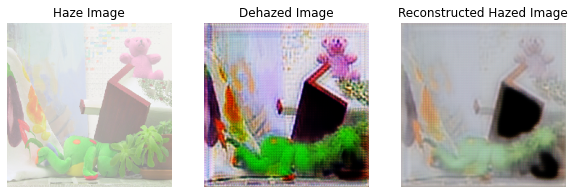

31


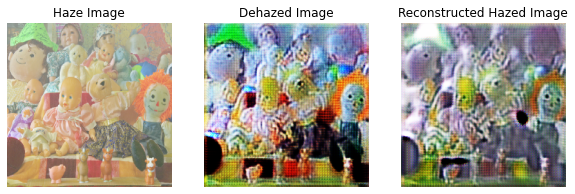

32


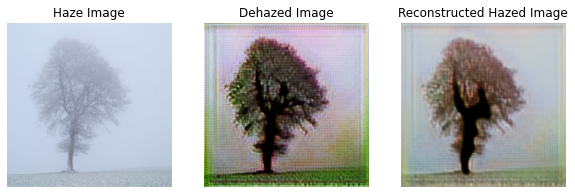

33


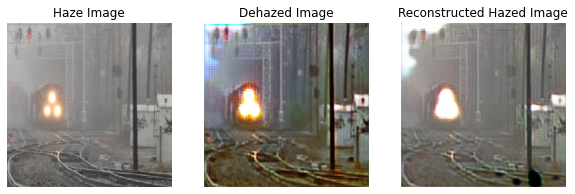

34


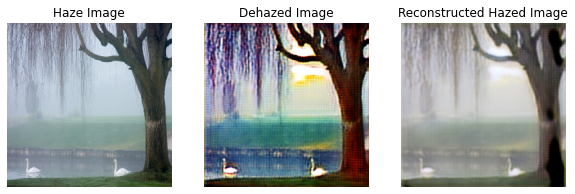

35


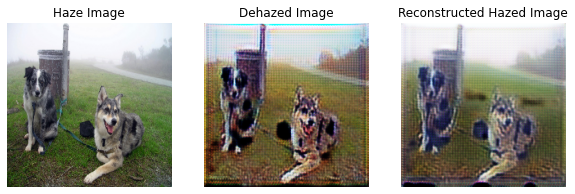

36


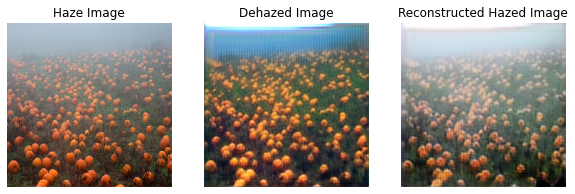

37


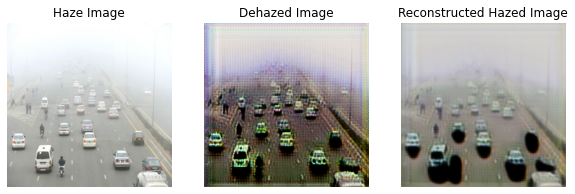

38


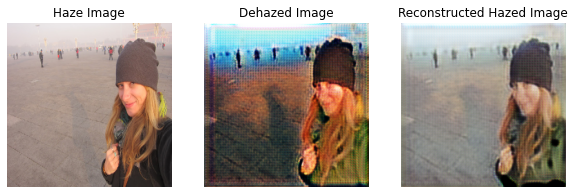

39


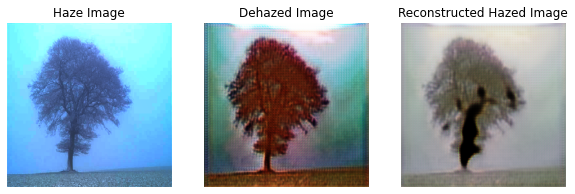

40


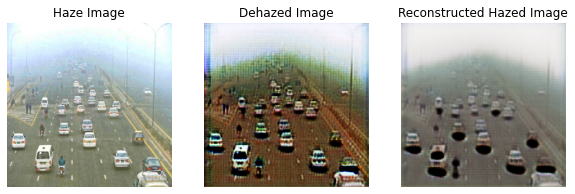

In [35]:
# import Opencv
import cv2
count=1 
for i in range(51,2041,51):
    print(count)
    plt_model(i)
    count+=1

## Evaluation Metrics:

A haze removal algorithm’s performance can be evaluated on several factors, among them, two of the most frequently used factors are the PSNR and SSIM.

- ##### Peak Signal to Noise Ratio (PSNR) measures the ability of the algorithm to remove noise from a noisy image. Two identical images will have a PSNR value of infinity.For measuring haze removal capability, a higher PSNR value indicates better performance. 

- ##### Structural Similarity Index Measure (SSIM), measures how similar two images are. Two identical images will have a SSIM of 1.


In [36]:
import math
import numpy as np

def calculate_psnr(img1, img2):
    # img1 and img2 have range [0, 255]
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2)**2)
    if mse == 0:
        return float('inf')
    return 20 * math.log10(255.0 / math.sqrt(mse))


In [37]:
import math
import numpy as np
import cv2

def ssim(img1, img2):
    C1 = (0.01 * 255)**2
    C2 = (0.03 * 255)**2

    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    kernel = cv2.getGaussianKernel(11, 1.5)
    window = np.outer(kernel, kernel.transpose())

    mu1 = cv2.filter2D(img1, -1, window)[5:-5, 5:-5]  # valid
    mu2 = cv2.filter2D(img2, -1, window)[5:-5, 5:-5]
    mu1_sq = mu1**2
    mu2_sq = mu2**2
    mu1_mu2 = mu1 * mu2
    sigma1_sq = cv2.filter2D(img1**2, -1, window)[5:-5, 5:-5] - mu1_sq
    sigma2_sq = cv2.filter2D(img2**2, -1, window)[5:-5, 5:-5] - mu2_sq
    sigma12 = cv2.filter2D(img1 * img2, -1, window)[5:-5, 5:-5] - mu1_mu2

    ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / ((mu1_sq + mu2_sq + C1) *
                                                            (sigma1_sq + sigma2_sq + C2))
    return ssim_map.mean()


def calculate_ssim(img1, img2):
    '''calculate SSIM
    img1, img2: [0, 255]
    '''
    img1= img1.reshape(256,256,3)
    img2 = img2.reshape(256,256,3)
    if not img1.shape == img2.shape:
        raise ValueError('Input images must have the same dimensions.')
    if img1.ndim == 2:
        return ssim(img1, img2)
    elif img1.ndim == 3:
        if img1.shape[2] == 3:
            ssims = []
            for i in range(3):
                ssims.append(ssim(img1, img2))
            return np.array(ssims).mean()
        elif img1.shape[2] == 1:
            return ssim(np.squeeze(img1), np.squeeze(img2))
    else:
        raise ValueError('Wrong input image dimensions.')

### TEST IMAGES: Taken from both indoor and outdoor images.

In [51]:
# from skimage import io
# img = io.imread(file_path)

import cv2
import glob
from skimage.transform import rescale, resize, downscale_local_mean

images = [cv2.imread(file) for file in glob.glob('../input/indoor-outdoor/indoor_outdoor/*.png')]
images = np.array(images)
image_resized = np.array([resize(i, (256,256),anti_aliasing=True) for i in images])
# dataA = load_images(path1)
# print('Loaded Indoor data: ', dataA.shape)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  if __name__ == '__main__':


In [53]:
image_resized.shape
#plt.imshow(image_resized)

(10, 256, 256, 3)

(1, 256, 256, 3)
(1, 256, 256, 3)


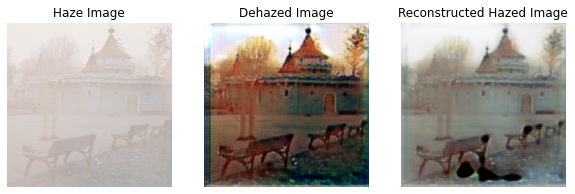

PSNR:  48.92165268289769
SSIM:  0.8806550250595125
(1, 256, 256, 3)
(1, 256, 256, 3)


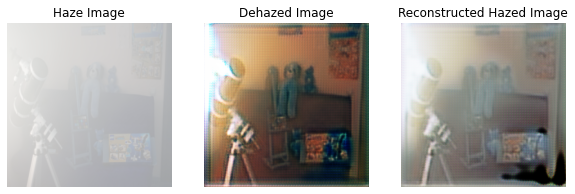

PSNR:  49.25249377873251
SSIM:  0.88864160969994
(1, 256, 256, 3)
(1, 256, 256, 3)


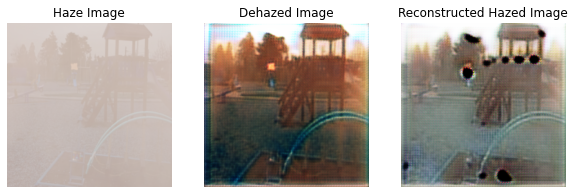

PSNR:  49.371817110260146
SSIM:  0.8900125225773405
(1, 256, 256, 3)
(1, 256, 256, 3)


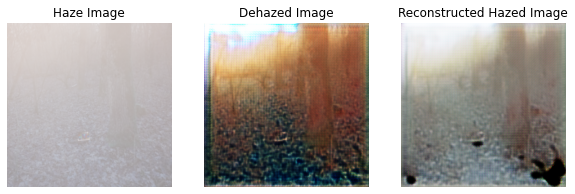

PSNR:  49.80218417581848
SSIM:  0.9012086818483539
(1, 256, 256, 3)
(1, 256, 256, 3)


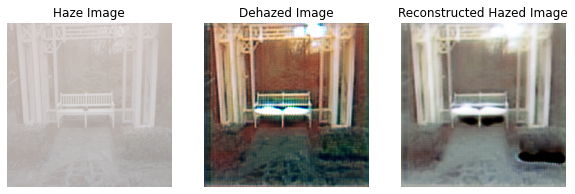

PSNR:  50.19286523353534
SSIM:  0.9127294391729494
(1, 256, 256, 3)
(1, 256, 256, 3)


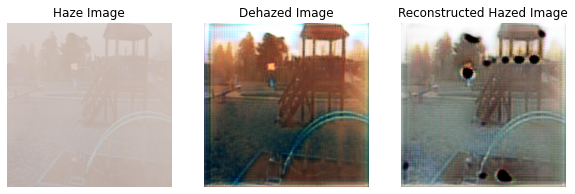

PSNR:  49.37181715851189
SSIM:  0.8900125237388677
(1, 256, 256, 3)
(1, 256, 256, 3)


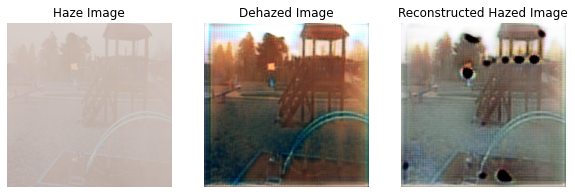

PSNR:  49.371817124729205
SSIM:  0.8900125230283175
(1, 256, 256, 3)
(1, 256, 256, 3)


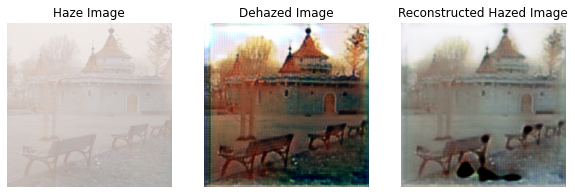

PSNR:  48.921652644946064
SSIM:  0.8806550240587604
(1, 256, 256, 3)
(1, 256, 256, 3)


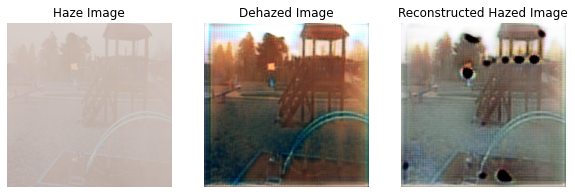

PSNR:  49.37181715163679
SSIM:  0.8900125236321307
(1, 256, 256, 3)
(1, 256, 256, 3)


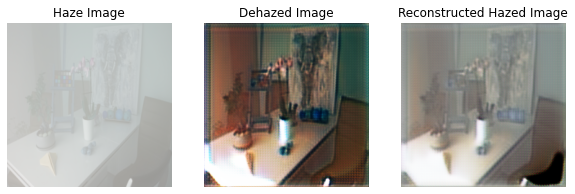

PSNR:  49.37423989020162
SSIM:  0.8924750204647182


In [55]:
cust = {'InstanceNormalization': InstanceNormalization}
model_AtoB = load_model('g_model_AtoB_002040.h5', cust)
model_BtoA = load_model('g_model_BtoA_002040.h5', cust)
PSNR_arr = []
SSIM_arr = []
for i in range(10):
    A_real = select_sample(image_resized)
    #i_ = i.reshape(1, 256,256,3)
    i_ = A_real
    B_generate  = model_AtoB.predict(i_)
    A_reconstructed = model_BtoA.predict(B_generate)
    print(B_generate.shape)
    print(A_reconstructed.shape)
    show_plot(i_, B_generate, A_reconstructed)
    psnr_val = calculate_psnr(i_, B_generate) 
    ssim_val = calculate_ssim(i_, B_generate)
    print("PSNR: ",psnr_val)
    print("SSIM: ",ssim_val)
    PSNR_arr.append(psnr_val)
    SSIM_arr.append(ssim_val)

In [62]:
import pandas as pd
psnr_ssim_df=pd.DataFrame({'PSNR':PSNR_arr,'SSIM':SSIM_arr})

In [63]:
psnr_ssim_df

,PSNR,SSIM
0,48.921653,0.880655
1,49.252494,0.888642
2,49.371817,0.890013
3,49.802184,0.901209
4,50.192865,0.912729
5,49.371817,0.890013
6,49.371817,0.890013
7,48.921653,0.880655
8,49.371817,0.890013
9,49.374240,0.892475


In [66]:
print("Peak Signal-to-Noise Ratio: ",np.mean(PSNR_arr))
print("Structural Similarity Index Measure: ",np.mean(SSIM_arr))

Peak Signal-to-Noise Ratio:  49.39523569512697
Structural Similarity Index Measure:  0.8916414893280891


### THANK YOU!